In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_pla_30322.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_ani_10197.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_nat_00098.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_nat_30407.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_arc_20034.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_sec_30053.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_pla_30069.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_nat_30645.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_cha_30461.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_arc_30140.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_txt_00100.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_arc_30059.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_pla_30330.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_cha_30427.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_nat_30499.jpg
/kaggle/input/casia-dataset/casia/CASIA2/Au/Au_pla_30222.jpg
/kaggle/input/casia-data

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(2)
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [5]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout

In [6]:
from keras.callbacks import EarlyStopping
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools

In [7]:
def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'
    
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)
    
    ela_image = ImageChops.difference(image, temp_image)
    
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff
    
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image

In [8]:
import tensorflow as tf
class Config:
    CASIA1 = "../input/casia-dataset/CASIA1"
    CASIA2 = "../input/casia-dataset/CASIA2"
    autotune = tf.data.experimental.AUTOTUNE
    epochs = 30
    batch_size = 32
    lr = 1e-3
    name = 'xception'
    n_labels = 2
    image_size = (224, 224)
    decay = 1e-6
    momentum = 0.95
    nesterov = False

In [9]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    
    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff

In [10]:
def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')
        
    items = list(items)
        
    p = random.choice(items)
    return p.as_posix()

In [11]:
def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')
        
    items = list(items)
        
    p = random.choice(items)
    return p.as_posix()

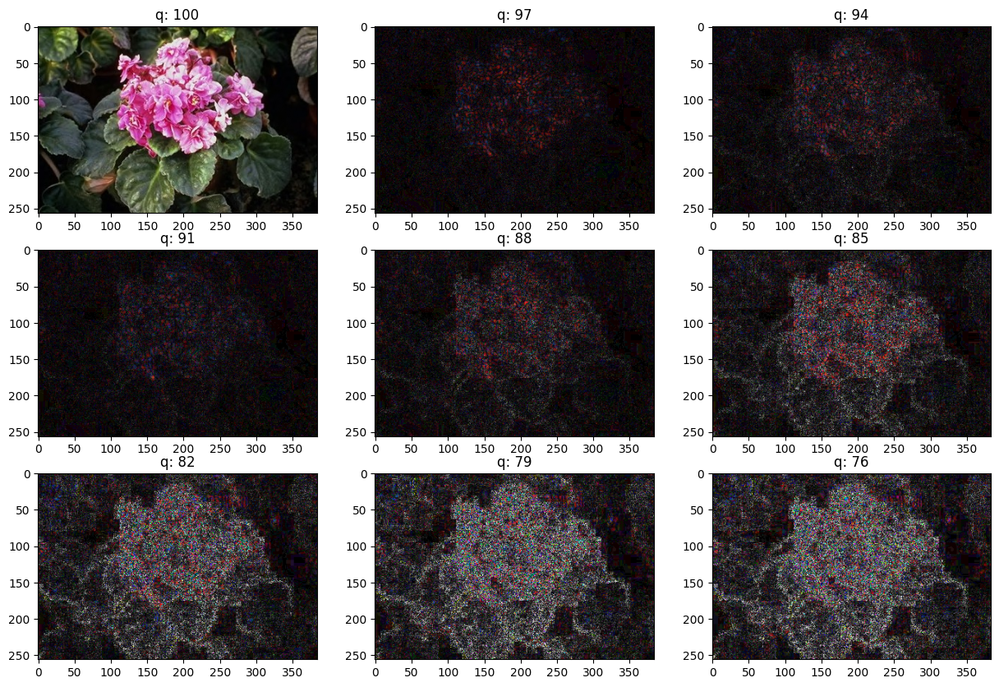

In [12]:
import cv2
from os.path import join, exists, isdir
from pathlib import Path
import random
p = join(Config.CASIA2, 'Au/')
p = random_sample(p)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 3
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i) 
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

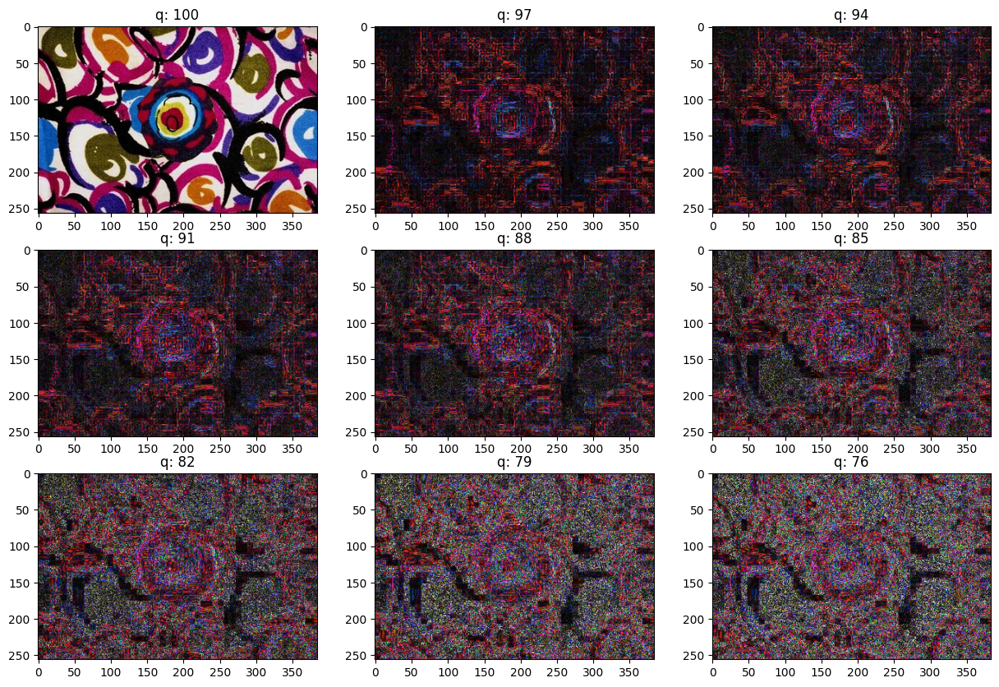

In [13]:
p = join(Config.CASIA2, 'Tp/')
p = random_sample(p)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 3
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i) 
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

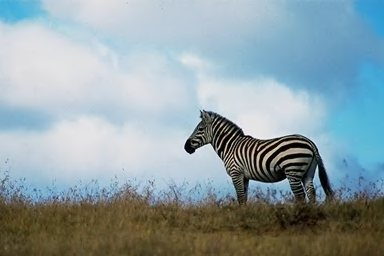

In [14]:
real_image_path = '../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg'
Image.open(real_image_path)

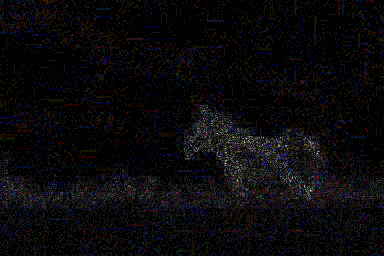

In [15]:
convert_to_ela_image(real_image_path, 91)

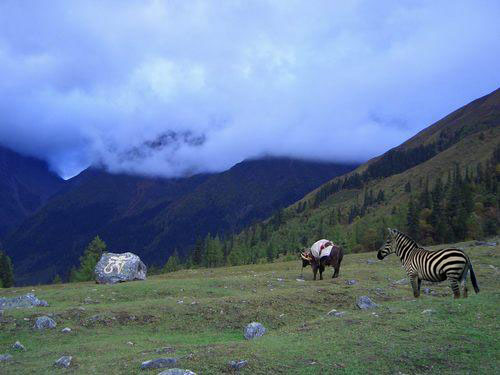

In [16]:
fake_image_path = '../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg'
Image.open(fake_image_path)

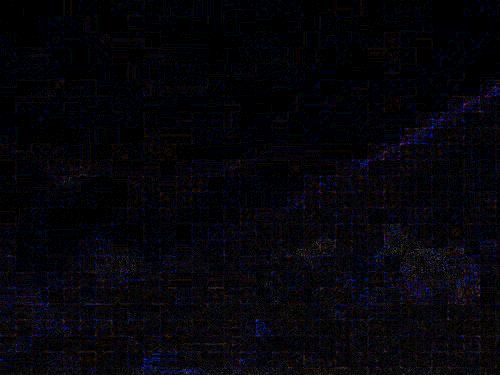

In [17]:
convert_to_ela_image(fake_image_path, 91)

In [19]:
from skimage.restoration import (denoise_wavelet, estimate_sigma)
from skimage.util import random_noise
import skimage.io

# Load the image
img_r1 = skimage.io.imread('../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg')
img_r = skimage.img_as_float(img_r1)  # Converting image to float

# Noise estimation
sigma_est = estimate_sigma(img_r, channel_axis=-1, average_sigmas=True)  

# Denoising using BayesShrink
img_bayes = denoise_wavelet(img_r, method='BayesShrink', mode='soft', wavelet_levels=3,
                            wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)

# Denoising using VisuShrink
img_visushrink = denoise_wavelet(img_r, method='VisuShrink', mode='soft', sigma=sigma_est/3, wavelet_levels=5,
                                 wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)


/opt/conda/lib/python3.10/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


In [20]:
import cv2
psnr_noisy = cv2.PSNR(img_r,img_r)
psnr_noisy

361.20199909921956

In [21]:
psnr_bayes = cv2.PSNR(img_r,img_bayes)
psnr_bayes

122.94205708554246

In [22]:
psnr_visu = cv2.PSNR(img_r,img_visushrink)
psnr_visu

100.27511465238143

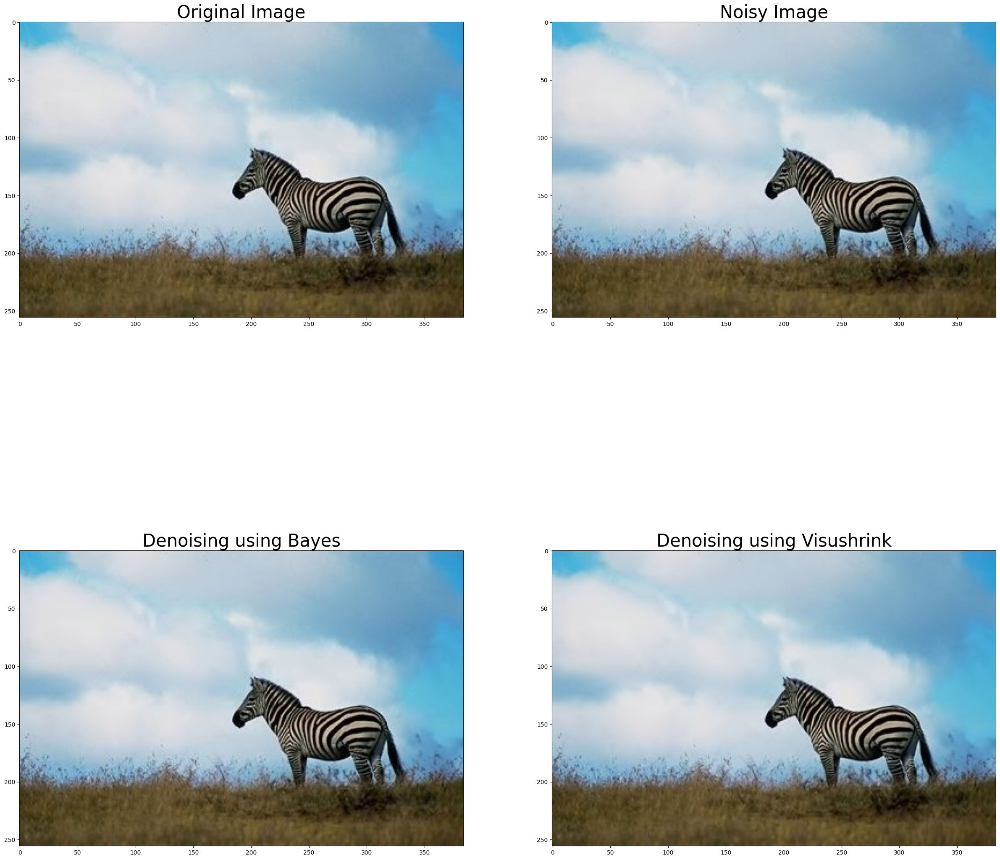

In [23]:
plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.imshow(img_r1,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_r,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Denoising using Bayes',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Denoising using Visushrink',fontsize=30)

plt.show()

In [24]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 100.27511465238143
PSNR[Original vs. Denoised(Bayes)] 122.94205708554246


In [26]:
from skimage.restoration import (denoise_wavelet, estimate_sigma)
from skimage.util import random_noise
import skimage.io

# Load the image
img_r1 = skimage.io.imread('../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg')
img_r = skimage.img_as_float(img_r1)  # Converting image to float

# Noise estimation
sigma_est = estimate_sigma(img_r, channel_axis=-1, average_sigmas=True)  # Noise estimation

# Denoising using BayesShrink
img_bayes = denoise_wavelet(img_r, method='BayesShrink', mode='soft', wavelet_levels=3,
                            wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)

# Denoising using VisuShrink
img_visushrink = denoise_wavelet(img_r, method='VisuShrink', mode='soft', sigma=sigma_est / 3, wavelet_levels=5,
                                 wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)


In [27]:
import cv2
psnr_noisy = cv2.PSNR(img_f,img_f)
psnr_noisy

361.20199909921956

In [30]:
import cv2

# Resize denoised image to match the dimensions of the original image
img_bayes_resized = cv2.resize(img_bayes, (img_f.shape[1], img_f.shape[0]))

# Ensure both images are of the same type (e.g., uint8)
img_f_uint8 = (img_f * 255).astype(np.uint8) if img_f.dtype == np.float64 else img_f
img_bayes_uint8 = (img_bayes_resized * 255).astype(np.uint8) if img_bayes_resized.dtype == np.float64 else img_bayes_resized

# Compute PSNR after resizing
psnr_bayes = cv2.PSNR(img_f_uint8, img_bayes_uint8)
print("PSNR for BayesShrink Denoising (resized):", psnr_bayes)


PSNR for BayesShrink Denoising (resized): 9.754722627794155


In [32]:
import cv2
import numpy as np

# Resize the VisuShrink denoised image to match the original image dimensions
img_visushrink_resized = cv2.resize(img_visushrink, (img_f.shape[1], img_f.shape[0]))

# Convert images to the same type (e.g., uint8)
img_f_uint8 = (img_f * 255).astype(np.uint8) if img_f.dtype == np.float64 else img_f
img_visushrink_uint8 = (img_visushrink_resized * 255).astype(np.uint8) if img_visushrink_resized.dtype == np.float64 else img_visushrink_resized

# Calculate PSNR
psnr_visu = cv2.PSNR(img_f_uint8, img_visushrink_uint8)
print("PSNR for VisuShrink Denoising (resized):", psnr_visu)


PSNR for VisuShrink Denoising (resized): 9.755888535005488


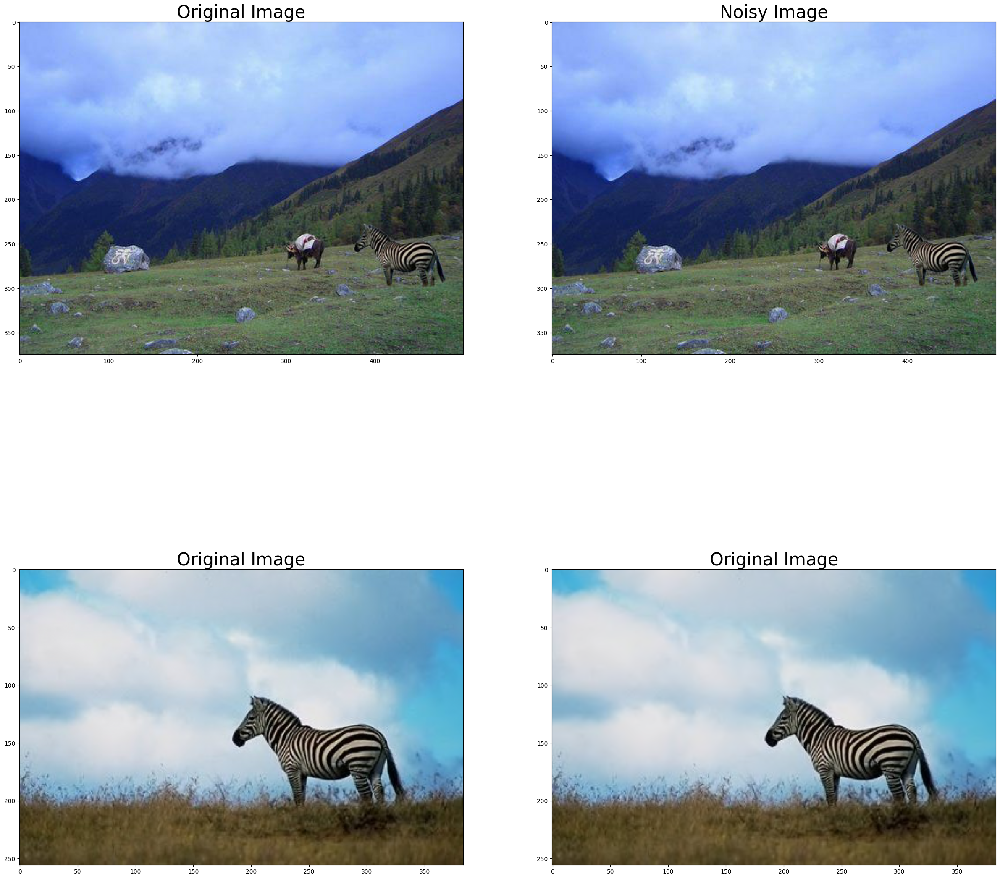

In [33]:
plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [34]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 9.755888535005488
PSNR[Original vs. Denoised(Bayes)] 9.754722627794155


In [35]:
# Color-image denoising
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise
# from sklearn.metrics import peak_signal_noise_ratio
import skimage.io

In [36]:
def denoise_img(img):
    #img=skimage.io.imread('../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
    img=skimage.img_as_float(img_f) #converting image as float


    sigma_est=estimate_sigma(img,multichannel=True,average_sigmas=True)  #Noise estimation

    # Denoising using Bayes
    img_bayes=denoise_wavelet(img,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


    #Denoising using Visushrink
    img_visushrink=denoise_wavelet(img,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
    wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)
    return img_bayes 

In [37]:
image_size = (128, 128)

In [38]:
def prepare_image(image_path):
    return np.array(convert_to_ela_image(image_path, 91).resize(image_size)).flatten() / 255.0

In [39]:
X = [] # ELA converted images
Y = [] # 0 for fake, 1 for real

In [40]:
import random
path = '../input/casia-dataset/CASIA2/Au/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(1)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

random.shuffle(X)
X = X[:2100]
Y = Y[:2100]
print(len(X), len(Y))

Processing 500 images
Processing 1000 images
Processing 1500 images
Processing 2000 images
Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
Processing 4500 images
Processing 5000 images
Processing 5500 images
Processing 6000 images
Processing 6500 images
Processing 7000 images
2100 2100


In [41]:
path = '../input/casia-dataset/CASIA2/Tp/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(0)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
4164 4164


In [42]:
import numpy as np
X = np.array(X)
Y = to_categorical(Y, 2)
X = X.reshape(-1, 128, 128, 3)

In [43]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size = 0.2, random_state=5)
X = X.reshape(-1,1,1,1)
print(len(X_train), len(Y_train))
print(len(X_val), len(Y_val))

3331 3331
833 833


In [44]:
def build_model():
    model = Sequential()
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(MaxPool2D(pool_size = (2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(256, activation = 'relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation = 'softmax'))
    return model

In [45]:
model = build_model()
model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 124, 124, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 120, 120, 32)   │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 60, 60, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 60, 60, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    29,491,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,520,034 (112.61 MB)

 Trainable params: 29,520,034 (112.61 MB)

 Non-trainable params: 0 (0.00 B)

In [46]:
from keras import optimizers
model.compile(loss='categorical_crossentropy', optimizer='Nadam', metrics=['accuracy'])

In [50]:
from tensorflow.keras.optimizers import Adam

# Define parameters
epochs = 25
batch_size = 32
init_lr = 1e-4

# Define optimizer
optimizer = Adam(learning_rate=init_lr)


In [51]:
early_stopping = EarlyStopping(monitor = 'val_acc',
                              min_delta = 0,
                              patience = 2,
                              verbose = 0,
                              mode = 'auto')

In [53]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

x_train2 = np.array(X_train, copy=True) 
y_train2 = np.array(Y_train, copy=True) 

# Image data generator with data augmentation
datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=10,
    fill_mode='nearest',
    validation_split=0.2  # Splitting data for validation
)

# Fit the data generator (for normalization)
datagen.fit(X_train)

print(type(X_train))

# Define generators for training and validation
train_generator = datagen.flow(x_train2, y_train2, batch_size=32, subset='training')
validation_generator = datagen.flow(x_train2, y_train2, batch_size=32, subset='validation')

# Set up early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=30, verbose=1, mode='min')

# Train the model using fit (fit_generator is deprecated)
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[early_stopping]
)


<class 'numpy.ndarray'>
Epoch 1/25


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


84/84 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step - accuracy: 0.6802 - loss: 4.7287 - val_accuracy: 0.8243 - val_loss: 0.3777
Epoch 2/25
84/84 ━━━━━━━━━━━━━━━━━━━━ 167s 2s/step - accuracy: 0.8567 - loss: 0.3783 - val_accuracy: 0.8829 - val_loss: 0.3281
Epoch 3/25
84/84 ━━━━━━━━━━━━━━━━━━━━ 167s 2s/step - accuracy: 0.8789 - loss: 0.3152 - val_accuracy: 0.8649 - val_loss: 0.3250
Epoch 4/25
84/84 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.9008 - loss: 0.2727 - val_accuracy: 0.8483 - val_loss: 0.3592
Epoch 5/25
84/84 ━━━━━━━━━━━━━━━━━━━━ 202s 2s/step - accuracy: 0.9031 - loss: 0.2445 - val_accuracy: 0.8769 - val_loss: 0.3197
Epoch 6/25
84/84 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.9110 - loss: 0.2326 - val_accuracy: 0.9129 - val_loss: 0.2316
Epoch 7/25
84/84 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.9265 - loss: 0.2038 - val_accuracy: 0.9084 - val_loss: 0.2452
Epoch 8/25
84/84 ━━━━━━━━━━━━━━━━━━━━ 168s 2s/step - accuracy: 0.9133 - loss: 0.2122 - val_accuracy: 0.9054 - val_loss: 0.

In [ ]:
model.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])

In [ ]:
hist = model.fit(X_train,
                 Y_train,
                 batch_size = batch_size,
                 epochs = epochs,
                validation_data = (X_val, Y_val),
                callbacks = [early_stopping])

In [ ]:
model.save('model_casia_run1.h5')

In [ ]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
Y_pred = model.predict(X_val)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_val,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes) 
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(2))

In [ ]:
class_names = ['fake', 'real']
real_image_path = '../input/casia-dataset/CASIA2/Au/Au_ani_00040.jpg'
Image.open(real_image_path)

In [ ]:
image = prepare_image(real_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

In [ ]:
fake_image_path = '/kaggle/input/casia-dataset/CASIA2/Tp/Tp_D_NRD_S_N_ani00041_ani00040_00161.tif'
Image.open(fake_image_path)

In [ ]:
image = prepare_image(fake_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

In [ ]:
fake_image = os.listdir('../input/casia-dataset/CASIA2/Tp/')
correct = 0
total = 0
for file_name in fake_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        fake_image_path = os.path.join('../input/casia-dataset/CASIA2/Tp/', file_name)
        image = prepare_image(fake_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total += 1
        if y_pred_class == 0:
            correct += 1

In [ ]:
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

In [ ]:
real_image = os.listdir('../input/casia-dataset/CASIA2/Au/')
correct_r = 0
total_r = 0
for file_name in real_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        real_image_path = os.path.join('../input/casia-dataset/CASIA2/Au/', file_name)
        image = prepare_image(real_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total_r += 1
        if y_pred_class == 1:
            correct_r += 1

In [ ]:
correct += correct_r
total += total_r
print(f'Total: {total_r}, Correct: {correct_r}, Acc: {correct_r / total_r * 100.0}')
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

In [ ]:
image_path1 = '/kaggle/input/casia-dataset/CASIA1/Au/Au_ani_0028.jpg'
Image.open(image_path1)

In [ ]:
image = prepare_image(image_path1)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

In [ ]:
image_path2 = '/kaggle/input/casia-dataset/CASIA1/Sp/Sp_D_NNN_A_ani0028_pla0007_0284.jpg'
Image.open(image_path2)

In [ ]:
image = prepare_image(image_path2)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

In [ ]:
convert_to_ela_image(image_path1, 91)

In [ ]:
image_1_ELA=convert_to_ela_image(image_path1, 91)

In [ ]:
convert_to_ela_image(image_path2, 91)

In [ ]:
image_2_ELA=convert_to_ela_image(image_path2, 91)

In [ ]:
ela_image = ImageChops.difference(image_1_ELA, image_2_ELA)

In [ ]:
ela_image

In [ ]:
print(y_pred_class)

In [ ]:
def find_manipulated_region(ela, threshold=50):
    mask = np.array(ela) > threshold

    # Find the bounding box of the masked region
    if np.any(mask):
        coords = np.argwhere(mask)
        return coords
    else:
        return None

In [ ]:
def make_pixels_white(img, white_coords):
    width, height = img.size
    black_img = Image.new('RGB', (width, height), color='black')
    img_arr = np.array(img)
    black_arr = np.array(black_img)
    for coord in white_coords:
        x, y, z = coord
        black_arr[x,y,:] = [255,255,255]
    mask = np.all(black_arr == [255,255,255], axis=-1)
    img_arr[mask] = [255,255,255]
    new_img = Image.fromarray(img_arr)
    return new_img

In [ ]:
if y_pred_class==0:
    ela=convert_to_ela_image(image_path2,91)
    coords=find_manipulated_region(ela)
    modify_boundary=make_pixels_white(ela,coords)
    modify_boundary.show()